In [90]:
import numpy as np
import skimage as sk
import skimage.io as skio
from matplotlib import pyplot as plt

In [91]:
from skimage.transform import rescale, resize, downscale_local_mean
from scipy import ndimage

In [92]:
def ssd(image1, image2) -> int:
    return sum(sum((image1-image2)**2))

def ncc(image1, image2) -> int:
    return np.dot(np.linalg.norm(image1), np.linalg.norm(image2))
    
def get_displacement(image1, image2, margin, loss, scale=None, pyramid=False, window=0) -> (int, int):
    displacement = (0, 0)
    minimum = float('inf')
    x_margin, y_margin = margin
    if not pyramid:
        curr_x_margin = -x_margin
        curr_y_margin = -y_margin
    else:
        curr_x_margin = x_margin - (2*(scale))
        curr_y_margin = y_margin - (2*(scale))
        x_margin = x_margin + (2*(scale))
        y_margin = y_margin + (2*(scale))
#         print(scale, curr_x_margin, curr_y_margin, x_margin, y_margin)
    y_temp = curr_y_margin
    while curr_x_margin <= x_margin:
        while curr_y_margin <= y_margin:
            image1_shifted = np.roll(np.roll(image1, shift=curr_x_margin, axis=0), shift=curr_y_margin, axis=1)
            height, width = image1.shape
            # cropped
            y_crop, x_crop = int(0.05 * height), int(0.05 * width)
            loss_val = loss(image1_shifted[y_crop: height-y_crop, x_crop:width-x_crop], image2[y_crop: height-y_crop, x_crop:width-x_crop])
#             loss_val = loss(image1_shifted, image2)
            if loss == "ncc":
                loss_val = -1 * loss_val
            if minimum > loss_val:
                displacement = (curr_x_margin, curr_y_margin)
                minimum = loss_val
            curr_y_margin += 1
        curr_x_margin += 1
        curr_y_margin = y_temp
    return displacement
    
def align(image1, image2, margin, loss):
    x, y = get_displacement(image1, image2, margin, loss)
#     print((x, y))
    print((y, x))
    return np.roll(np.roll(image1, shift=x, axis=0), shift=y, axis=1)

# edge detection
def align_sobel(image1, image2, margin, loss):
    x = np.array([
        [1, 0, -1],
        [2, 0, -2],
        [1, 0, -1]
    ])
    y = np.array([
        [1, 2, 1],
        [0, 0, 0],
        [-1, -2, -1]
    ])
    convolve_x1 = ndimage.convolve(image1, x, mode='constant', cval=0.0)
    convolve_y1 = ndimage.convolve(image1, y, mode='constant', cval=0.0)
    convolve_x2 = ndimage.convolve(image2, x, mode='constant', cval=0.0)
    convolve_y2 = ndimage.convolve(image2, y, mode='constant', cval=0.0)
    edge_image1 = np.sqrt(convolve_x1**2 + convolve_y1**2) 
    edge_image2 = np.sqrt(convolve_x2**2 + convolve_y2**2)
    
    x, y = get_displacement(edge_image1, edge_image2, margin, loss)
    print((x, y))
    return np.roll(np.roll(image1, shift=x, axis=0), shift=y, axis=1)

In [93]:
def get_pyramid_displacement(image1, image2, margin, loss, curr_lvl, original_lvl, window=0) -> (int, int):
    image1_rescaled = rescale(image1, 1/(2**curr_lvl), anti_aliasing=False)
    image2_rescaled = rescale(image2, 1/(2**curr_lvl), anti_aliasing=False)
    if curr_lvl == original_lvl:
        x, y = get_displacement(image1_rescaled, image2_rescaled, margin, loss)
    else:
        x, y = get_displacement(image1_rescaled, image2_rescaled, margin, loss, scale=original_lvl-curr_lvl+1, pyramid=True, window=window)
    if curr_lvl > 0:
        curr_lvl -= 1
        x = int(x * 2)
        y = int(y * 2)
        new_margin = (x, y)
#         print(new_margin)
        x, y = get_pyramid_displacement(image1, image2, new_margin, loss, curr_lvl, original_lvl, window=window)
    return x, y
    
def align_pyramid(image1, image2, margin, loss, lvl, edge=False, window=0):
    if not edge:
        x, y = get_pyramid_displacement(image1, image2, margin, loss, lvl, lvl, window=window)
    else:
        x = np.array([
        [1, 0, -1],
        [2, 0, -2],
        [1, 0, -1]
        ])
        y = np.array([
            [1, 2, 1],
            [0, 0, 0],
            [-1, -2, -1]
        ])
        convolve_x1 = ndimage.convolve(image1, x, mode='constant', cval=0.0)
        convolve_y1 = ndimage.convolve(image1, y, mode='constant', cval=0.0)
        convolve_x2 = ndimage.convolve(image2, x, mode='constant', cval=0.0)
        convolve_y2 = ndimage.convolve(image2, y, mode='constant', cval=0.0)
        edge_image1 = np.sqrt(convolve_x1**2 + convolve_y1**2) 
        edge_image2 = np.sqrt(convolve_x2**2 + convolve_y2**2)
        x, y = get_pyramid_displacement(edge_image1, edge_image2, margin, loss, lvl, lvl, window=window)
#     print((x, y))
    print((y, x))
    return np.roll(np.roll(image1, shift=x, axis=0), shift=y, axis=1)
#     return np.roll(np.roll(edge_image1, shift=x, axis=0), shift=y, axis=1)

In [94]:
import os
 
# Get the list of all files and directories
path = "./data"
dir_list = os.listdir(path)
dir_list

['emir.tif',
 'colorize_skel.py',
 'monastery.jpg',
 'church.tif',
 'three_generations.tif',
 'melons.tif',
 'onion_church.tif',
 'train.tif',
 'tobolsk.jpg',
 'icon.tif',
 'colorize_skel.m',
 'cathedral.jpg',
 'self_portrait.tif',
 'harvesters.tif',
 'sculpture.tif',
 'lady.tif']

In [107]:
def run_alignment(filename, aligned=False, edge=False, pyramid=False):
    # name of the input file
    imname = 'data/' + filename

    # read in the image
    im = skio.imread(imname)

    # convert to double (might want to do this later on to save memory)    
    im = sk.img_as_float(im)

    # compute the height of each part (just 1/3 of total)
    height = np.floor(im.shape[0] / 3.0).astype(np.int)

    # separate color channels
    b = im[:height]
    g = im[height: 2*height]
    r = im[2*height: 3*height]
    if aligned:
        if pyramid:
            ag = align_pyramid(g, b, (16, 16), ssd, 4, edge=edge)
            ar = align_pyramid(r, b, (16, 16), ssd, 4, edge=edge)
        else:
            ag = align(g, b, (16, 16), ssd)
            ar = align(r, b, (16, 16), ssd)
        # create a color image
        im_out = np.dstack([ar, ag, b])
    # save the image
    newfilename = filename.replace('.tif', '.jpg')
    fname = 'aligned photos/' + newfilename
    skio.imsave(fname, im_out)
    
    plt.figure(figsize=(10, 10))
    plt.imshow(im_out)

/var/folders/kn/yxzw4zbj07l0qg_snhcsdmpm0000gn/T/ipykernel_23475/7736781.py:11: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  height = np.floor(im.shape[0] / 3.0).astype(np.int)


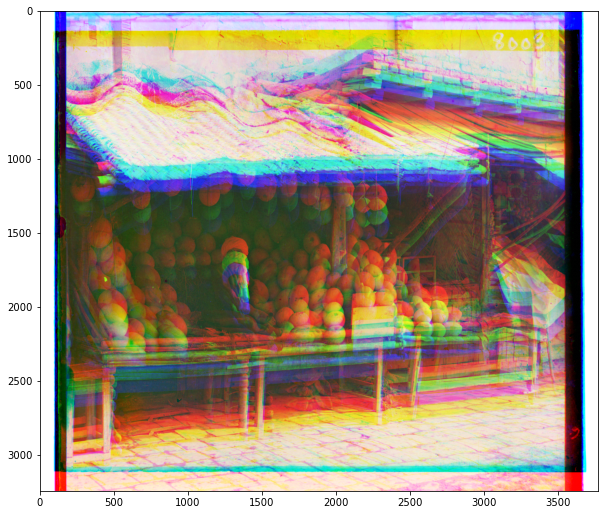

In [96]:
# name of the input file
imname = 'data/melons.tif'

# read in the image
im = skio.imread(imname)

# convert to double (might want to do this later on to save memory)    
im = sk.img_as_float(im)
    
# compute the height of each part (just 1/3 of total)
height = np.floor(im.shape[0] / 3.0).astype(np.int)

# separate color channels
b = im[:height]
g = im[height: 2*height]
r = im[2*height: 3*height]

# align the images
# functions that might be useful for aligning the images include:
# np.roll, np.sum, sk.transform.rescale (for multiscale)

# ag = align(g, b)
# ar = align(r, b)
# create a color image
# im_out = np.dstack([ar, ag, b])
im_out = np.dstack([r, g, b])

# save the image
# fname = '/saved/out_fname.jpg'
# skio.imsave(fname, im_out)

# display the image
plt.figure(figsize=(10, 10))
plt.imshow(im_out)

(10, -2)
(20, 2)
(40, 4)
(76, 0)
(77, 0)
(22, 2)
(44, 4)
(88, 6)
(170, 0)
(170, 0)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


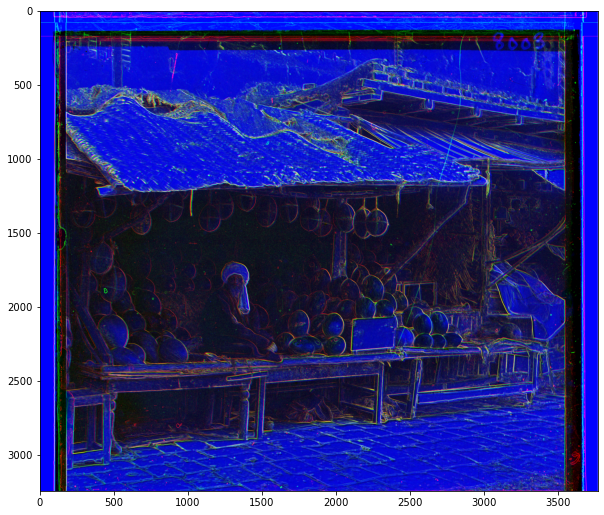

In [124]:
ag = align_pyramid(g, b, (16, 16), ssd, 4, edge=True)
ar = align_pyramid(r, b, (16, 16), ssd, 4, edge=True)
# create a color image
im_out = np.dstack([ar, ag, b])
plt.figure(figsize=(10, 10))
plt.imshow(im_out)

/var/folders/kn/yxzw4zbj07l0qg_snhcsdmpm0000gn/T/ipykernel_23475/731952522.py:12: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  height = np.floor(im.shape[0] / 3.0).astype(np.int)


(2, 5)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(3, 12)
cathedral.jpg
(2, -3)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(2, 3)
monastery.jpg
(2, 3)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(3, 6)
tobolsk.jpg


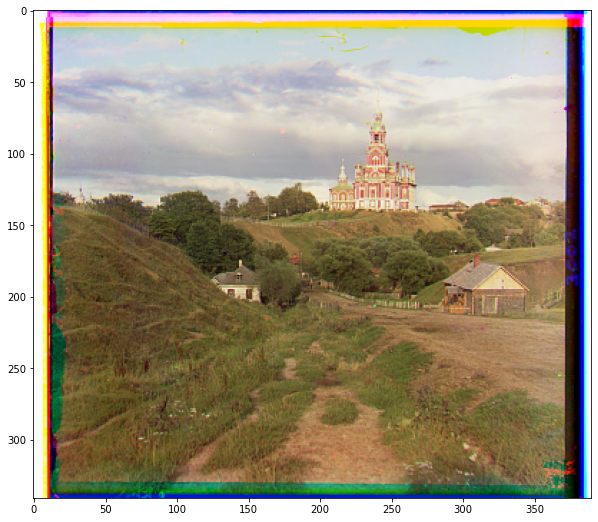

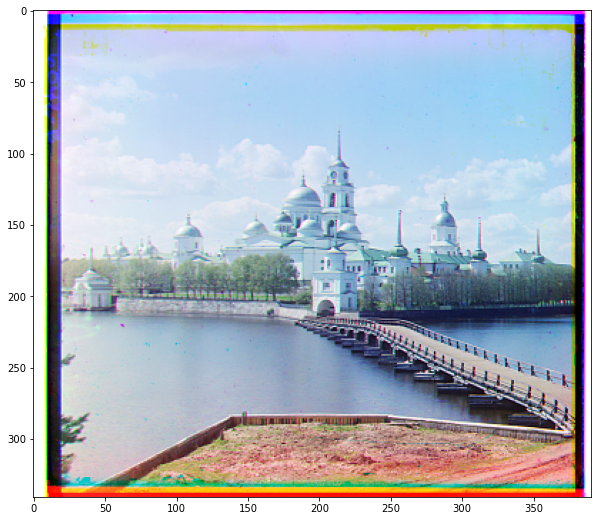

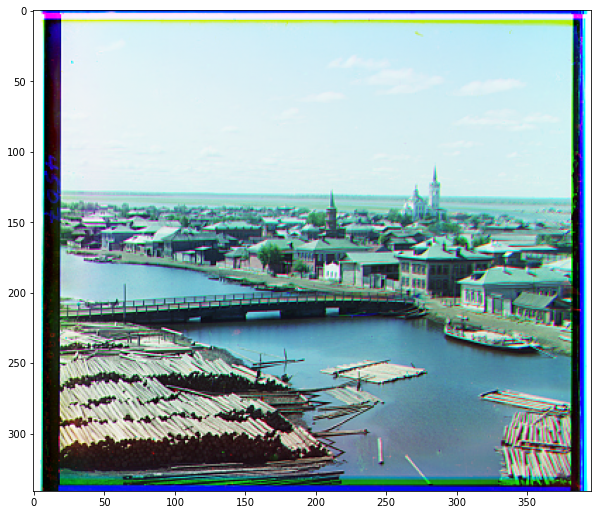

In [106]:
jpgs = ['cathedral.jpg', 'monastery.jpg', 'tobolsk.jpg']
# NO EDGE DETECTION SMALL FILES
for file in jpgs:
    run_alignment(file, aligned=True, edge=False, pyramid=False)
    print(file)

/var/folders/kn/yxzw4zbj07l0qg_snhcsdmpm0000gn/T/ipykernel_23475/482387286.py:12: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  height = np.floor(im.shape[0] / 3.0).astype(np.int)


(24, 49)
(43, 88)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


emir.tif
(3, 25)
(-5, 58)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


church.tif
(13, 55)
(10, 112)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


three_generations.tif
(9, 82)
(11, 177)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


melons.tif
(26, 51)
(36, 108)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


onion_church.tif
(6, 42)
(32, 87)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


train.tif
(17, 41)
(23, 89)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


icon.tif
(29, 79)
(34, 175)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


self_portrait.tif
(16, 60)
(13, 124)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


harvesters.tif
(-11, 33)
(-27, 140)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


sculpture.tif
(8, 55)
(12, 111)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


lady.tif


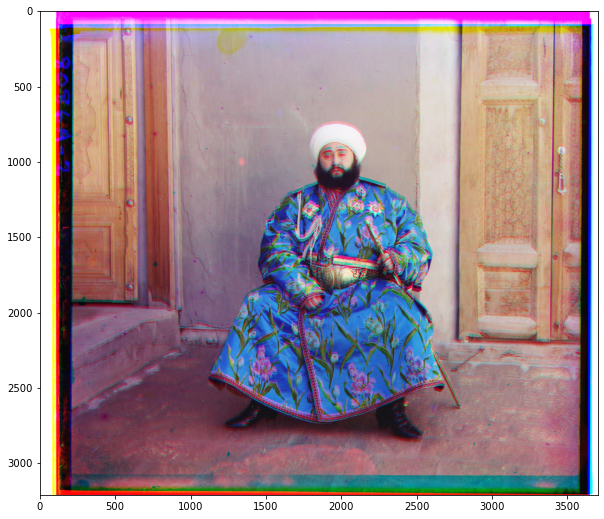

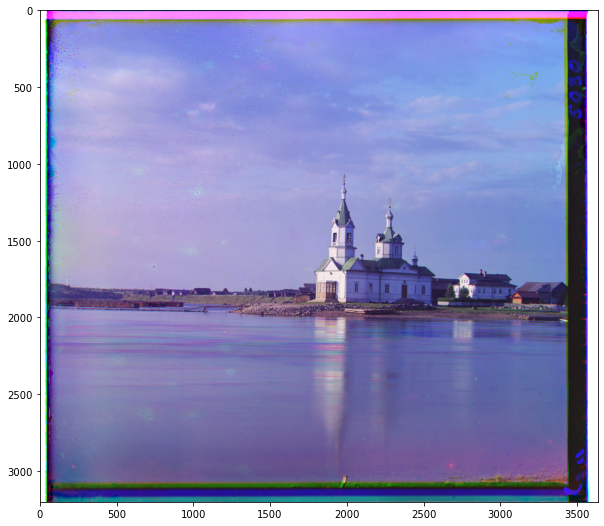

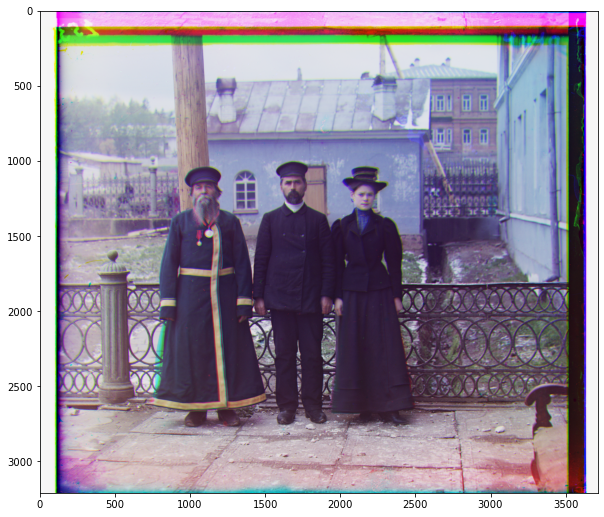

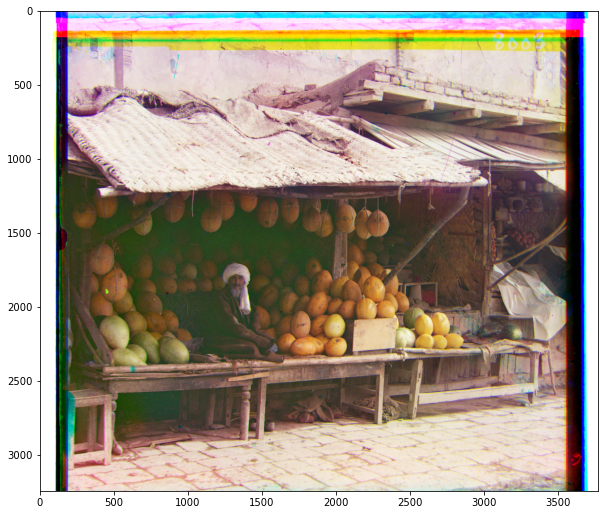

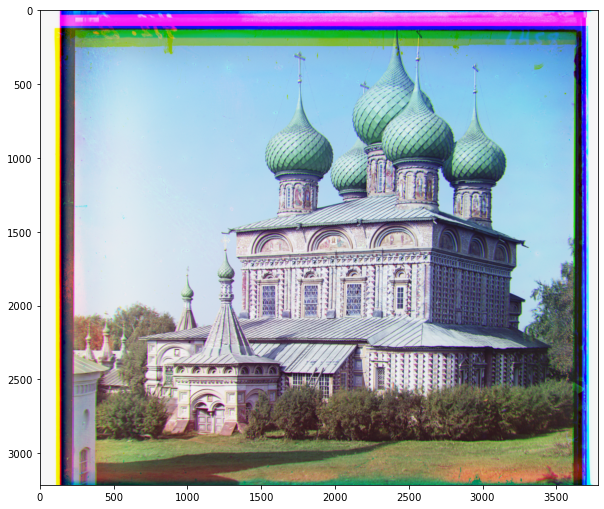

...

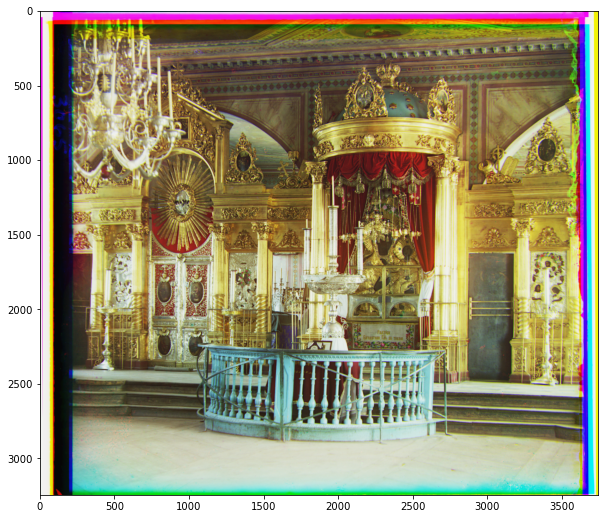

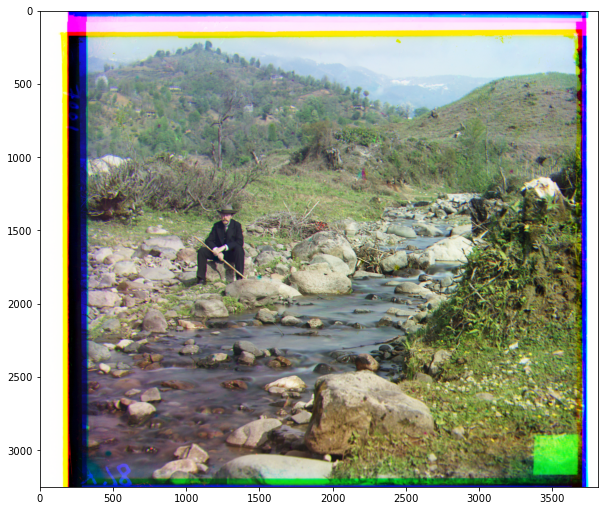

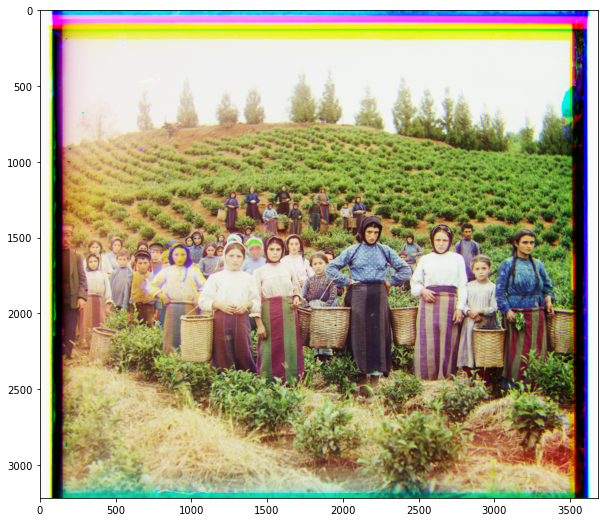

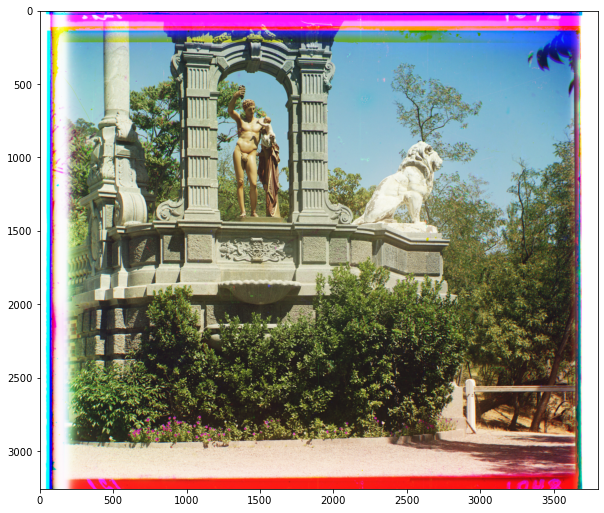

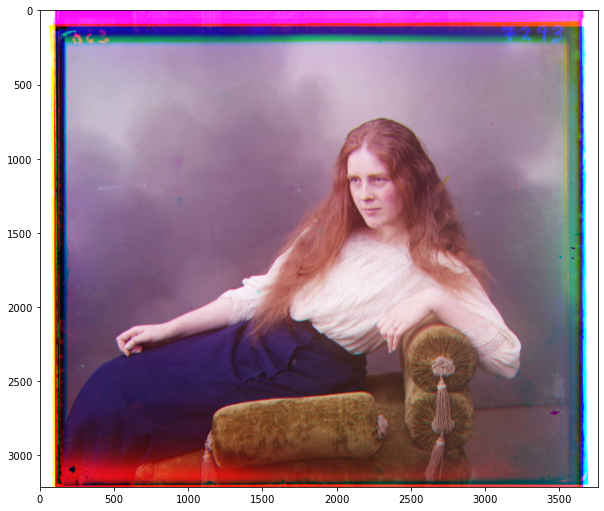

In [108]:
# CROPPED 
# NO EDGE DETECTION LARGE FILES
for file in dir_list:
    if file == 'colorize_skel.py' or file == 'colorize_skel.m' or file in jpgs:
        continue
    run_alignment(file, aligned=True, edge=False, pyramid=True)
    print(file)

/var/folders/kn/yxzw4zbj07l0qg_snhcsdmpm0000gn/T/ipykernel_23475/482387286.py:12: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  height = np.floor(im.shape[0] / 3.0).astype(np.int)


(10, 80)
(12, 177)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


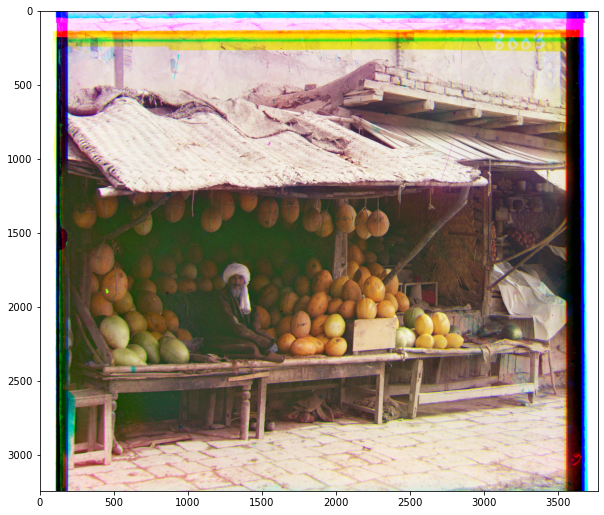

In [112]:
# MELONS WITH EDGE DETECTION
run_alignment("melons.tif", aligned=True, edge=True, pyramid=True)

/var/folders/kn/yxzw4zbj07l0qg_snhcsdmpm0000gn/T/ipykernel_23475/1442104438.py:12: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  height = np.floor(im.shape[0] / 3.0).astype(np.int)


(23, 49)
(40, 107)
emir.tif


KeyboardInterrupt: 

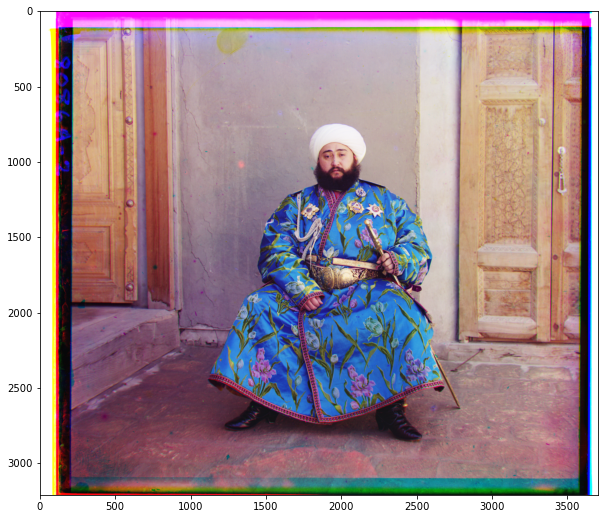

In [102]:
# CROPPED 
# LARGE FILES
for file in dir_list:
    if file == 'colorize_skel.py' or file == 'colorize_skel.m' or file in jpgs:
        continue
    run_alignment(file, aligned=True, edge=True, pyramid=True)
    print(file)

/var/folders/kn/yxzw4zbj07l0qg_snhcsdmpm0000gn/T/ipykernel_23475/482387286.py:12: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  height = np.floor(im.shape[0] / 3.0).astype(np.int)


(4, 28)
(7, 68)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


painting.tif
(7, 40)
(-10, 98)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


protectorate.tif
(7, 41)
(3, 102)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


two_men.tif
(15, 20)
(39, 81)


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


camel.tif


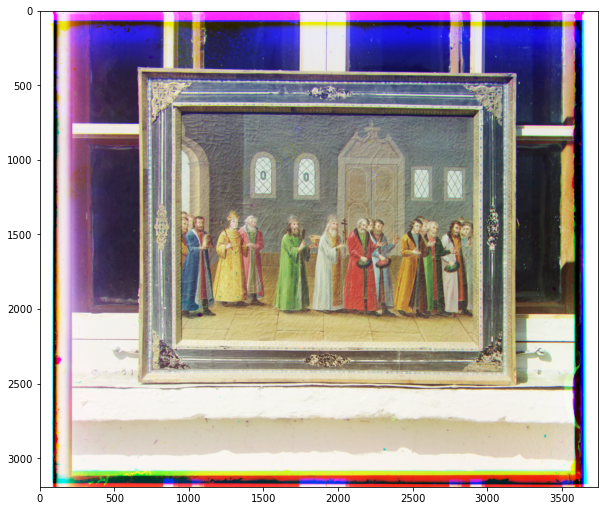

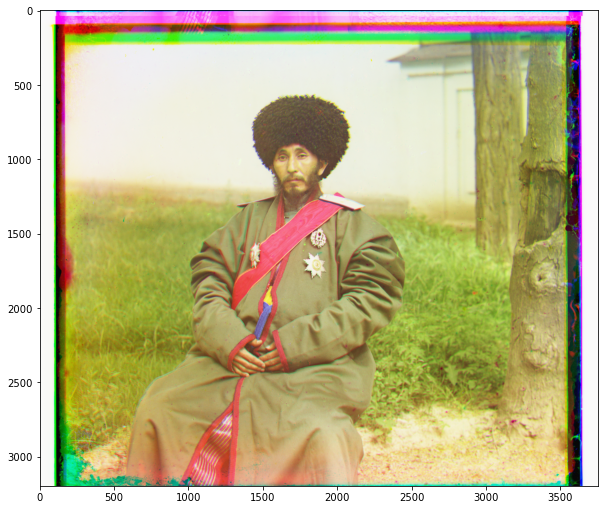

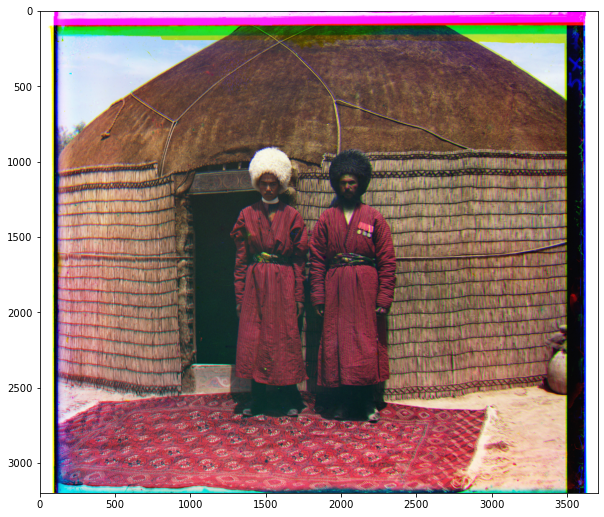

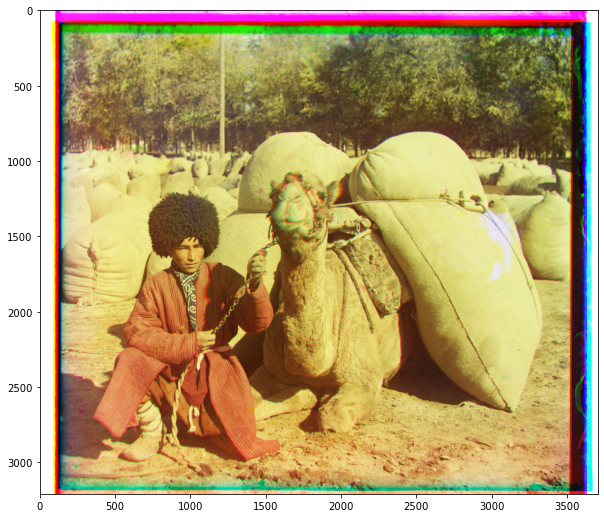

In [113]:
# CROPPED 
my_images = ['painting.tif', 'protectorate.tif', 'two_men.tif', 'camel.tif']
for file in my_images:
    run_alignment(file, aligned=True, edge=False, pyramid=True)
    print(file)